In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/fashionpedia/instances_attributes_train2020.json
/kaggle/input/fashionpedia/instances_attributes_val2020.json
/kaggle/input/fashionpedia/val_test2020/test/165d068e46d8eaa97392d5db91620721.jpg
/kaggle/input/fashionpedia/val_test2020/test/b1dfbc0da1055c82a599e6bb777bdb81.jpg
/kaggle/input/fashionpedia/val_test2020/test/e79958a7625419a99dfc40935ad3ae6e.jpg
/kaggle/input/fashionpedia/val_test2020/test/5a90282a3570b920d4e28f0de0a71df4.jpg
/kaggle/input/fashionpedia/val_test2020/test/dd4525a10b6110df29f0a6b19e6b924b.jpg
/kaggle/input/fashionpedia/val_test2020/test/a2b9272493f4264d9a8878a8ab8d847d.jpg
/kaggle/input/fashionpedia/val_test2020/test/19dd339879e0b1efdda6a92bbd2c754d.jpg
/kaggle/input/fashionpedia/val_test2020/test/d5da50f251cc2ba7d90e5ab8251d2b94.jpg
/kaggle/input/fashionpedia/val_test2020/test/1c1484bd95e170ad133660f8a69419b1.jpg
/kaggle/input/fashionpedia/val_test2020/test/e14733841b04c64e75789a91fbe549b3.jpg
/kaggle/input/fashionpedia/val_test2020/test/d76083cc75d

In [ ]:
!pip install git+https://github.com/openai/CLIP.git
!pip install ftfy regex tqdm
!pip install qdrant-client==1.7.3
!pip install -U bitsandbytes accelerate transformers --quiet
!pip install transformers

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-p_0qy4u1
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-p_0qy4u1
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.6 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369490 sha256=4154635297adcd1d99d765dbf1204941c1af90238912096644206c8c718cf9ce
  Stored in directory: /tmp/pip-ephem-wheel-cache-q0mqmpsn/wheels/35/3e/df/3d24cbfb3b6a06f17a2bfd7d1138900d4365d9028aa8f6e92f
Successfully built clip
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.3/206.3 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 68.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 138.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.3/323.3 kB 

In [ ]:
!pip install qdrant-client sentence-transformers transformers accelerate bitsandbytes -q
print("✓ Dependencies installed")

✓ Dependencies installed


In [ ]:
"""
Complete Configuration - Run this first
"""
from pathlib import Path
import torch

# Paths
BASE_DIR = Path("/kaggle/input/fashionpedia")
TRAIN_IMG_DIR = BASE_DIR / "train2020/train"
TEST_IMG_DIR = BASE_DIR / "val_test2020/test"
TRAIN_ANNOTATIONS = BASE_DIR / "instances_attributes_train2020.json"
VAL_ANNOTATIONS = BASE_DIR / "instances_attributes_val2020.json"

OUTPUT_DIR = Path("/kaggle/working")
PROCESSED_DATA_DIR = OUTPUT_DIR / "processed_data"
EMBEDDINGS_DIR = OUTPUT_DIR / "embeddings"
VECTOR_DB_DIR = OUTPUT_DIR / "vector_db"

for dir_path in [PROCESSED_DATA_DIR, EMBEDDINGS_DIR, VECTOR_DB_DIR]:
    dir_path.mkdir(parents=True, exist_ok=True)

# Model Config
CLIP_MODEL_NAME = "ViT-L/14"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
FLORENCE_MODEL_ID = "microsoft/Florence-2-large"

# Taxonomy
CLOTHING_CATEGORIES = [
    "shirt", "blouse", "t-shirt", "tank top", "sweater", "cardigan", 
    "hoodie", "sweatshirt", "blazer", "jacket", "coat", "vest",
    "pants", "jeans", "trousers", "shorts", "skirt", "leggings",
    "dress", "jumpsuit", "romper", "overall", "suit", "tuxedo",
    "raincoat", "windbreaker", "parka", "trench coat", "puffer jacket",
    "scarf", "hat", "cap", "belt", "tie", "bow tie", "glasses", "sunglasses",
    "shoe", "shoes", "sneakers", "boots"
]

COLORS = [
    "red", "blue", "green", "yellow", "orange", "purple", "pink",
    "black", "white", "gray", "brown", "beige", "navy", "maroon",
    "teal", "olive", "cream", "tan", "khaki", "burgundy", "cyan",
    "bright", "dark", "light", "pastel", "gold", "silver"
]

SCENE_CONTEXTS = [
    "office", "home", "indoor", "room", "building", "cafe", "restaurant",
    "store", "mall", "gym", "studio", "bedroom", "living room",
    "outdoor", "street", "park", "beach", "garden", "urban", "city",
    "countryside", "mountain", "forest", "field",
    "party", "wedding", "conference", "casual setting", "formal setting"
]

STYLE_ATTRIBUTES = [
    "formal", "casual", "business", "professional", "sporty", "athletic",
    "elegant", "vintage", "modern", "trendy", "classic", "bohemian",
    "streetwear", "minimalist", "preppy", "chic", "relaxed"
]

# Indexing
BATCH_SIZE = 32
MAX_IMAGES = None
MIN_IMAGE_SIZE = 224
MAX_IMAGE_SIZE = 1024

ATTRIBUTE_WEIGHTS = {
    'global': 0.15,
    'clothing': 0.35,
    'color': 0.25,
    'scene': 0.25
}

VECTOR_DB_CONFIG = {
    'collection_name': 'fashion_images',
    'vector_size': 768,
    'distance': 'cosine',
    'hnsw_config': {'ef_construct': 100, 'm': 16}
}

PROMPT_TEMPLATES = {
    'clothing': [
        "a photo of a person wearing a {item}",
        "a {item}",
        "someone in a {item}",
        "{item} clothing"
    ],
    'color': [
        "a photo of {color} clothing",
        "{color} colored clothes",
        "a person wearing {color}",
        "{color} fashion"
    ],
    'scene': [
        "a photo taken in {scene}",
        "a photo of someone at {scene}",
        "{scene} setting",
        "background is {scene}"
    ],
    'style': [
        "{style} outfit",
        "{style} fashion style",
        "a {style} look"
    ]
}

LOG_LEVEL = "INFO"
LOG_FILE = OUTPUT_DIR / "indexing.log"

print("✓ Config loaded successfully")
print(f"  Device: {DEVICE}")
print(f"  Output directory: {OUTPUT_DIR}")

✓ Config loaded successfully
  Device: cuda
  Output directory: /kaggle/working


In [ ]:
"""
Data structures and ImageMetadata class
"""
from dataclasses import dataclass
from typing import List, Optional
from pathlib import Path

@dataclass
class ImageMetadata:
    """Structured metadata for each image"""
    image_id: int
    file_name: str
    file_path: Path
    width: int
    height: int
    clothing_items: List[str]
    colors: List[str]
    attributes: List[str]
    num_people: int
    scene_context: Optional[str] = None
    style_tags: List[str] = None
    is_valid: bool = True
    florence_caption: Optional[str] = None

print("✓ Data structures defined")

✓ Data structures defined


In [ ]:
pip install --upgrade transformers accelerate

Note: you may need to restart the kernel to use updated packages.


In [ ]:




import torch
from transformers import AutoModelForCausalLM, AutoProcessor
import gc
import json
import logging
from collections import defaultdict
from pathlib import Path
from PIL import Image
from tqdm.notebook import tqdm

# --- Configuration (Assumed from your environment) ---
# FLORENCE_MODEL_ID = "microsoft/Florence-2-large"
# DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("="*80)
print("🚀 INITIALIZING STABLE FLORENCE-2 PIPELINE")
print("="*80)

# 1. CLEANUP
def cleanup():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

cleanup()

# 2. MODEL LOADING WITH ALL FIXES
florence_model = None
florence_processor = None

try:
    print("\n[1/3] Loading Model & Processor...")
    
    florence_processor = AutoProcessor.from_pretrained(
        FLORENCE_MODEL_ID, 
        trust_remote_code=True
    )
    
    # FIX: Use 'dtype' and 'attn_implementation="eager"' to bypass SDPA error
    florence_model = AutoModelForCausalLM.from_pretrained(
        FLORENCE_MODEL_ID,
        dtype=torch.float16 if DEVICE == "cuda" else torch.float32,
        trust_remote_code=True,
        attn_implementation="eager" 
    ).to(DEVICE)

    # FIX: Inject missing attribute if it still fails to register
    if not hasattr(florence_model, '_supports_sdpa'):
        florence_model._supports_sdpa = False

    florence_model.eval()
    print(f"  ✓ Model loaded on {DEVICE} with dtype {next(florence_model.parameters()).dtype}")

except Exception as e:
    print(f"  ✗ Critical Load Error: {e}")

# 3. ENRICHMENT FUNCTION WITH FIXES
def enrich_image_with_florence(image_path, model, processor):
    """
    Processes image with fixes for:
    1. Dtype mismatch (Input vs Model)
    2. NoneType shape error (use_cache=False)
    3. Beam search bugs (num_beams=1)
    """
    if model is None or processor is None:
        return "Model not loaded"

    try:
        image = Image.open(image_path).convert("RGB")
        prompt = "<DETAILED_CAPTION>"
        
        # Determine target device/dtype
        model_dtype = next(model.parameters()).dtype
        model_device = next(model.parameters()).device
        
        # Prepare inputs
        inputs = processor(text=prompt, images=image, return_tensors="pt")
        
        # FIX: Manual conversion of all input tensors to match model
        inputs = {k: v.to(model_device).to(model_dtype) if v.dtype.is_floating_point else v.to(model_device) 
                  for k, v in inputs.items()}
        
        with torch.no_grad():
            generated_ids = model.generate(
                input_ids=inputs["input_ids"],
                pixel_values=inputs["pixel_values"],
                max_new_tokens=512,
                do_sample=False,
                num_beams=1,      # FIX: Avoid beam search bugs
                use_cache=False   # FIX: Avoid 'NoneType' has no attribute 'shape'
            )
        
        generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
        
        parsed_answer = processor.post_process_generation(
            generated_text, 
            task=prompt, 
            image_size=(image.width, image.height)
        )
        
        return parsed_answer.get(prompt, generated_text)

    except Exception as e:
        return f"Error: {str(e)}"

# 4. UPDATED DATA LOADER CLASS
class FashionpediaLoader:
    def __init__(self, annotation_path, image_dir, max_images=None):
        self.annotation_path = Path(annotation_path)
        self.image_dir = Path(image_dir)
        self.max_images = max_images
        
        with open(self.annotation_path, 'r') as f:
            self.coco_data = json.load(f)
        
        self.images = {img['id']: img for img in self.coco_data['images']}
        self.annotations = self.coco_data['annotations']
        self.image_to_annotations = defaultdict(list)
        for ann in self.annotations:
            self.image_to_annotations[ann['image_id']].append(ann)

    def get_all_metadata(self, model, processor):
        results = []
        image_ids = list(self.images.keys())
        if self.max_images:
            image_ids = image_ids[:self.max_images]
            
        print(f"\n[2/3] Processing {len(image_ids)} images with Florence-2...")
        
        for img_id in tqdm(image_ids):
            img_info = self.images[img_id]
            file_path = self.image_dir / img_info['file_name']
            
            # Use the enrichment helper
            caption = enrich_image_with_florence(file_path, model, processor)
            
            results.append({
                "image_id": img_id,
                "caption": caption,
                "file_name": img_info['file_name']
            })
        return results

print("\n[3/3] System Ready.")

2026-01-16 11:01:28.057774: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1768561288.222748      23 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1768561288.269549      23 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1768561288.648192      23 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1768561288.648236      23 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1768561288.648239      23 computation_placer.cc:177] computation placer alr

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

🚀 INITIALIZING STABLE FLORENCE-2 PIPELINE

[1/3] Loading Model & Processor...


preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- processing_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

configuration_florence2.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- configuration_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_florence2.py: 0.00B [00:00, ?B/s]

/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

model.safetensors:   0%|          | 0.00/1.55G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/51.0 [00:00<?, ?B/s]

  ✓ Model loaded on cuda with dtype torch.float16

[3/3] System Ready.


INDEXING 

In [8]:
"""
Data Loader with FIXED Florence-2 Integration
"""
import json
import logging
from collections import defaultdict
import numpy as np
from PIL import Image
from tqdm.notebook import tqdm

logging.basicConfig(level=LOG_LEVEL)
logger = logging.getLogger(__name__)

class FashionpediaLoader:
    def __init__(self, annotation_path, image_dir, max_images=None):
        self.annotation_path = annotation_path
        self.image_dir = image_dir
        self.max_images = max_images
        
        logger.info(f"Loading annotations from {annotation_path}")
        with open(annotation_path, 'r') as f:
            self.coco_data = json.load(f)
        
        self._build_lookups()
        logger.info(f"Loaded {len(self.images)} images with {len(self.annotations)} annotations")
    
    def _build_lookups(self):
        self.images = {img['id']: img for img in self.coco_data['images']}
        self.categories = {cat['id']: cat for cat in self.coco_data['categories']}
        self.category_id_to_name = {cat['id']: cat['name'] for cat in self.coco_data['categories']}
        
        if 'attributes' in self.coco_data:
            self.attributes = {attr['id']: attr for attr in self.coco_data['attributes']}
            self.attribute_id_to_name = {attr['id']: attr['name'] for attr in self.coco_data['attributes']}
        else:
            self.attributes = {}
            self.attribute_id_to_name = {}
        
        self.annotations = self.coco_data['annotations']
        self.image_to_annotations = defaultdict(list)
        for ann in self.annotations:
            self.image_to_annotations[ann['image_id']].append(ann)
    
    def extract_colors_from_attributes(self, attribute_ids):
        colors = []
        for attr_id in attribute_ids:
            attr_name = self.attribute_id_to_name.get(attr_id, "").lower()
            for color in COLORS:
                if color in attr_name:
                    colors.append(color)
        return list(set(colors))
    
    def enrich_with_florence(self, metadata, model, processor):
        """FIXED Florence-2 enrichment"""
        if model is None or processor is None:
            return metadata
        
        try:
            image = Image.open(metadata.file_path).convert("RGB")
            prompt = "<DETAILED_CAPTION>"
            
            model_dtype = next(model.parameters()).dtype
            model_device = next(model.parameters()).device
            
            inputs = processor(text=prompt, images=image, return_tensors="pt")
            
            # Convert all tensors to match model dtype
            converted_inputs = {}
            for key, value in inputs.items():
                if isinstance(value, torch.Tensor):
                    value = value.to(model_device)
                    if value.dtype in [torch.float32, torch.float64, torch.float16, torch.bfloat16]:
                        value = value.to(model_dtype)
                    converted_inputs[key] = value
                else:
                    converted_inputs[key] = value
            
            # Generate with greedy decoding (no beam search)
            with torch.no_grad():
                generated_ids = model.generate(
                    input_ids=converted_inputs["input_ids"],
                    pixel_values=converted_inputs["pixel_values"],
                    max_new_tokens=512,
                    do_sample=False,
                    num_beams=1,
                    use_cache=False# CRITICAL: avoids past_key_values bug
                )
            
            generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
            
            parsed = processor.post_process_generation(
                generated_text,
                task=prompt,
                image_size=(image.width, image.height)
            )
            
            caption = parsed.get(prompt, generated_text) if isinstance(parsed, dict) else str(parsed)
            metadata.florence_caption = caption
            
            if metadata.style_tags is None:
                metadata.style_tags = []
            metadata.style_tags.append(str(caption)[:100])
            
        except Exception as e:
            logger.error(f"Florence enrichment failed for {metadata.image_id}: {str(e)}")
        
        return metadata
    
    def extract_metadata(self, image_id):
        img_data = self.images[image_id]
        annotations = self.image_to_annotations[image_id]
        
        clothing_items = []
        all_attributes = []
        colors = []
        
        for ann in annotations:
            category_name = self.category_id_to_name.get(ann['category_id'], 'unknown')
            clothing_items.append(category_name)
            
            if 'attribute_ids' in ann:
                attr_ids = ann['attribute_ids']
                attributes = [self.attribute_id_to_name.get(aid, '') for aid in attr_ids]
                all_attributes.extend(attributes)
                colors.extend(self.extract_colors_from_attributes(attr_ids))
        
        clothing_items = list(set(clothing_items))
        colors = list(set(colors))
        all_attributes = list(set(all_attributes))
        
        metadata = ImageMetadata(
            image_id=image_id,
            file_name=img_data['file_name'],
            file_path=self.image_dir / img_data['file_name'],
            width=img_data['width'],
            height=img_data['height'],
            clothing_items=clothing_items,
            colors=colors,
            attributes=all_attributes,
            num_people=len(annotations),
            style_tags=[]
        )
        
        metadata.is_valid = self._validate_image(metadata)
        return metadata
    
    def _validate_image(self, metadata):
        if not metadata.file_path.exists():
            return False
        if metadata.width < MIN_IMAGE_SIZE or metadata.height < MIN_IMAGE_SIZE:
            return False
        if len(metadata.clothing_items) == 0:
            return False
        try:
            with Image.open(metadata.file_path) as img:
                img.verify()
            return True
        except:
            return False
    
    def get_all_metadata(self, florence_model=None, florence_processor=None):
        all_metadata = []
        image_ids = list(self.images.keys())
        
        if self.max_images:
            image_ids = image_ids[:self.max_images]
        
        logger.info(f"Processing {len(image_ids)} images...")
        
        for image_id in tqdm(image_ids, desc="Extracting metadata"):
            metadata = self.extract_metadata(image_id)
            if metadata.is_valid:
                if florence_model and florence_processor:
                    metadata = self.enrich_with_florence(metadata, florence_model, florence_processor)
                all_metadata.append(metadata)
        
        logger.info(f"Valid images: {len(all_metadata)} / {len(image_ids)}")
        return all_metadata
    
    def save_metadata(self, metadata_list, output_path):
        """CRITICAL METHOD - This was missing in old version!"""
        data = []
        for meta in metadata_list:
            data.append({
                'image_id': meta.image_id,
                'file_name': meta.file_name,
                'file_path': str(meta.file_path),
                'width': meta.width,
                'height': meta.height,
                'clothing_items': meta.clothing_items,
                'colors': meta.colors,
                'attributes': meta.attributes,
                'num_people': meta.num_people,
                'scene_context': meta.scene_context,
                'style_tags': meta.style_tags,
                'florence_caption': meta.florence_caption
            })
        
        with open(output_path, 'w') as f:
            json.dump(data, f, indent=2)
        logger.info(f"Saved metadata to {output_path}")
    
    def get_statistics(self, metadata_list):
        from collections import Counter
        stats = {
            'total_images': len(metadata_list),
            'clothing_distribution': dict(Counter([item for meta in metadata_list for item in meta.clothing_items]).most_common(20)),
            'color_distribution': dict(Counter([color for meta in metadata_list for color in meta.colors]).most_common(20)),
            'avg_items_per_image': sum(len(meta.clothing_items) for meta in metadata_list) / len(metadata_list) if metadata_list else 0
        }
        return stats

def load_and_preprocess_dataset(split='train', max_images=None, florence_model=None, florence_processor=None):
    """FIXED version with proper error handling"""
    if split == 'train':
        annotation_path = TRAIN_ANNOTATIONS
        image_dir = TRAIN_IMG_DIR
    else:
        annotation_path = VAL_ANNOTATIONS
        image_dir = TEST_IMG_DIR
    
    loader = FashionpediaLoader(annotation_path, image_dir, max_images)
    metadata_list = loader.get_all_metadata(florence_model, florence_processor)
    
    output_path = PROCESSED_DATA_DIR / f"{split}_metadata.json"
    loader.save_metadata(metadata_list, output_path)
    
    stats = loader.get_statistics(metadata_list)
    logger.info(f"\nDataset Statistics for {split}:")
    logger.info(f"Total images: {stats['total_images']}")
    logger.info(f"Avg items per image: {stats['avg_items_per_image']:.2f}")
    
    return metadata_list, loader

print("✓ Fixed data loader and Florence-2 loaded successfully!")
print("="*80)
print("\nNow you can run the complete pipeline in the next cell.")

✓ Fixed data loader and Florence-2 loaded successfully!

Now you can run the complete pipeline in the next cell.


In [9]:
"""
Multi-Attribute CLIP Encoder
"""
import torch
import torch.nn.functional as F
import clip
import numpy as np
from PIL import Image
from tqdm.notebook import tqdm
import logging

logging.basicConfig(level=LOG_LEVEL)
logger = logging.getLogger(__name__)

class MultiAttributeCLIPEncoder:
    def __init__(self, model_name=CLIP_MODEL_NAME, device=DEVICE):
        self.device = device
        self.model_name = model_name
        
        logger.info(f"Loading CLIP model: {model_name}")
        self.model, self.preprocess = clip.load(model_name, device=device)
        self.model.eval()
        
        self._precompute_attribute_prompts()
        logger.info(f"CLIP model loaded on {device}")
    
    def _precompute_attribute_prompts(self):
        logger.info("Pre-computing attribute prompt embeddings...")
        
        with torch.no_grad():
            self.clothing_prompts = {}
            for item in tqdm(CLOTHING_CATEGORIES, desc="Encoding clothing"):
                prompts = [template.format(item=item) for template in PROMPT_TEMPLATES['clothing']]
                text_tokens = clip.tokenize(prompts).to(self.device)
                embeddings = self.model.encode_text(text_tokens)
                embeddings = F.normalize(embeddings, dim=-1)
                self.clothing_prompts[item] = embeddings.mean(dim=0)
            
            self.color_prompts = {}
            for color in tqdm(COLORS, desc="Encoding colors"):
                prompts = [template.format(color=color) for template in PROMPT_TEMPLATES['color']]
                text_tokens = clip.tokenize(prompts).to(self.device)
                embeddings = self.model.encode_text(text_tokens)
                embeddings = F.normalize(embeddings, dim=-1)
                self.color_prompts[color] = embeddings.mean(dim=0)
            
            self.scene_prompts = {}
            for scene in tqdm(SCENE_CONTEXTS, desc="Encoding scenes"):
                prompts = [template.format(scene=scene) for template in PROMPT_TEMPLATES['scene']]
                text_tokens = clip.tokenize(prompts).to(self.device)
                embeddings = self.model.encode_text(text_tokens)
                embeddings = F.normalize(embeddings, dim=-1)
                self.scene_prompts[scene] = embeddings.mean(dim=0)
            
            self.style_prompts = {}
            for style in tqdm(STYLE_ATTRIBUTES, desc="Encoding styles"):
                prompts = [template.format(style=style) for template in PROMPT_TEMPLATES['style']]
                text_tokens = clip.tokenize(prompts).to(self.device)
                embeddings = self.model.encode_text(text_tokens)
                embeddings = F.normalize(embeddings, dim=-1)
                self.style_prompts[style] = embeddings.mean(dim=0)
        
        logger.info("Attribute prompt embeddings computed")
    
    def encode_image(self, image_path):
        try:
            image = Image.open(image_path).convert('RGB')
            image_input = self.preprocess(image).unsqueeze(0).to(self.device)
            
            with torch.no_grad():
                image_features = self.model.encode_image(image_input)
                image_features = F.normalize(image_features, dim=-1)
            
            return image_features.squeeze(0)
        except Exception as e:
            logger.error(f"Error encoding image {image_path}: {e}")
            return torch.zeros(768).to(self.device)
    
    def compute_attribute_embeddings(self, global_embedding, metadata):
        attribute_embeddings = {}
        
        with torch.no_grad():
            # Clothing
            clothing_items = [item for item in metadata.clothing_items if item in self.clothing_prompts]
            if clothing_items:
                clothing_embeds = torch.stack([self.clothing_prompts[item] for item in clothing_items])
                clothing_scores = (global_embedding @ clothing_embeds.T).softmax(dim=0)
                clothing_embedding = (clothing_scores.unsqueeze(1) * clothing_embeds).sum(dim=0)
            else:
                clothing_embedding = global_embedding
            attribute_embeddings['clothing'] = F.normalize(clothing_embedding, dim=-1)
            
            # Color
            colors = [color for color in metadata.colors if color in self.color_prompts]
            if colors:
                color_embeds = torch.stack([self.color_prompts[color] for color in colors])
                color_scores = (global_embedding @ color_embeds.T).softmax(dim=0)
                color_embedding = (color_scores.unsqueeze(1) * color_embeds).sum(dim=0)
            else:
                color_embedding = global_embedding
            attribute_embeddings['color'] = F.normalize(color_embedding, dim=-1)
            
            # Scene
            scene_embeds = torch.stack(list(self.scene_prompts.values()))
            scene_scores = global_embedding @ scene_embeds.T
            top_k_scenes = scene_scores.topk(k=3)
            top_scene_embeds = torch.stack([list(self.scene_prompts.values())[idx] for idx in top_k_scenes.indices])
            scene_weights = top_k_scenes.values.softmax(dim=0)
            scene_embedding = (scene_weights.unsqueeze(1) * top_scene_embeds).sum(dim=0)
            attribute_embeddings['scene'] = F.normalize(scene_embedding, dim=-1)
            
            top_scene_idx = top_k_scenes.indices[0].item()
            metadata.scene_context = list(self.scene_prompts.keys())[top_scene_idx]
            
            # Style
            style_embeds = torch.stack(list(self.style_prompts.values()))
            style_scores = global_embedding @ style_embeds.T
            top_k_styles = style_scores.topk(k=2)
            top_style_embeds = torch.stack([list(self.style_prompts.values())[idx] for idx in top_k_styles.indices])
            style_weights = top_k_styles.values.softmax(dim=0)
            style_embedding = (style_weights.unsqueeze(1) * top_style_embeds).sum(dim=0)
            attribute_embeddings['style'] = F.normalize(style_embedding, dim=-1)
            
            metadata.style_tags = [list(self.style_prompts.keys())[idx.item()] for idx in top_k_styles.indices]
        
        return attribute_embeddings
    
    def encode_image_with_attributes(self, metadata):
        global_embedding = self.encode_image(metadata.file_path)
        attribute_embeddings = self.compute_attribute_embeddings(global_embedding, metadata)
        
        embeddings = {
            'global': global_embedding.cpu().numpy(),
            'clothing': attribute_embeddings['clothing'].cpu().numpy(),
            'color': attribute_embeddings['color'].cpu().numpy(),
            'scene': attribute_embeddings['scene'].cpu().numpy(),
            'style': attribute_embeddings['style'].cpu().numpy()
        }
        return embeddings
    
    def encode_batch(self, metadata_list, batch_size=BATCH_SIZE):
        all_embeddings = []
        logger.info(f"Encoding {len(metadata_list)} images in batches of {batch_size}")
        
        for i in tqdm(range(0, len(metadata_list), batch_size), desc="Encoding images"):
            batch = metadata_list[i:i + batch_size]
            for metadata in batch:
                try:
                    embeddings = self.encode_image_with_attributes(metadata)
                    all_embeddings.append(embeddings)
                except Exception as e:
                    logger.error(f"Error encoding {metadata.file_name}: {e}")
                    dummy = np.zeros(768)
                    all_embeddings.append({
                        'global': dummy, 'clothing': dummy, 'color': dummy, 'scene': dummy, 'style': dummy
                    })
        return all_embeddings
    
    def save_embeddings(self, embeddings_list, output_path):
        logger.info(f"Saving embeddings to {output_path}")
        np.save(output_path, embeddings_list)

print("✓ CLIP encoder defined")

✓ CLIP encoder defined


In [10]:
"""
Vector Database Manager using Qdrant
"""
import logging
from typing import Dict, List, Optional, Tuple
from pathlib import Path
import json
import numpy as np
from qdrant_client import QdrantClient
from qdrant_client.models import (
    Distance, VectorParams, PointStruct, Filter, 
    FieldCondition, MatchValue, SearchParams
)

logging.basicConfig(level=LOG_LEVEL)
logger = logging.getLogger(__name__)

class FashionVectorDB:
    def __init__(self, path: Optional[Path] = None):
        if path is None:
            path = VECTOR_DB_DIR
        
        self.path = path
        self.client = QdrantClient(path=str(path))
        self.collection_name = VECTOR_DB_CONFIG['collection_name']
        logger.info(f"Initialized vector DB at {path}")
    
    def create_collection(self, recreate: bool = False):
        collections = self.client.get_collections().collections
        exists = any(c.name == self.collection_name for c in collections)
        
        if exists and recreate:
            logger.info(f"Deleting existing collection: {self.collection_name}")
            self.client.delete_collection(self.collection_name)
            exists = False
        
        if not exists:
            logger.info(f"Creating collection: {self.collection_name}")
            self.client.create_collection(
                collection_name=self.collection_name,
                vectors_config={
                    "global": VectorParams(size=VECTOR_DB_CONFIG['vector_size'], distance=Distance.COSINE),
                    "clothing": VectorParams(size=VECTOR_DB_CONFIG['vector_size'], distance=Distance.COSINE),
                    "color": VectorParams(size=VECTOR_DB_CONFIG['vector_size'], distance=Distance.COSINE),
                    "scene": VectorParams(size=VECTOR_DB_CONFIG['vector_size'], distance=Distance.COSINE),
                    "style": VectorParams(size=VECTOR_DB_CONFIG['vector_size'], distance=Distance.COSINE)
                },
                hnsw_config=VECTOR_DB_CONFIG['hnsw_config']
            )
            logger.info("Collection created successfully")
        else:
            logger.info(f"Collection {self.collection_name} already exists")
    
    def upsert_images(self, metadata_list: List, embeddings_list: List, batch_size: int = 100):
        if len(metadata_list) != len(embeddings_list):
            raise ValueError("Metadata and embeddings lists must have same length")
        
        logger.info(f"Upserting {len(metadata_list)} images to vector DB")
        
        points = []
        for idx, (metadata, embeddings) in enumerate(zip(metadata_list, embeddings_list)):
            point = PointStruct(
                id=metadata.image_id,
                vector={
                    "global": embeddings['global'].tolist(),
                    "clothing": embeddings['clothing'].tolist(),
                    "color": embeddings['color'].tolist(),
                    "scene": embeddings['scene'].tolist(),
                    "style": embeddings['style'].tolist()
                },
                payload={
                    "image_id": metadata.image_id,
                    "file_name": metadata.file_name,
                    "file_path": str(metadata.file_path),
                    "width": metadata.width,
                    "height": metadata.height,
                    "clothing_items": metadata.clothing_items,
                    "colors": metadata.colors,
                    "attributes": metadata.attributes,
                    "num_people": metadata.num_people,
                    "scene_context": metadata.scene_context,
                    "style_tags": metadata.style_tags if metadata.style_tags else []
                }
            )
            points.append(point)
        
        for i in range(0, len(points), batch_size):
            batch = points[i:i + batch_size]
            self.client.upsert(collection_name=self.collection_name, points=batch)
        
        logger.info(f"Successfully upserted {len(points)} points")
    
    def search(self, query_vector: np.ndarray, vector_name: str = "global", limit: int = 10, 
               filter_conditions: Optional[Filter] = None, score_threshold: Optional[float] = None):
        search_params = SearchParams(hnsw_ef=128, exact=False)
        
        results = self.client.search(
            collection_name=self.collection_name,
            query_vector=(vector_name, query_vector.tolist()),
            limit=limit,
            query_filter=filter_conditions,
            score_threshold=score_threshold,
            search_params=search_params,
            with_payload=True
        )
        
        return [(r.id, r.score, r.payload) for r in results]
    
    def multi_vector_search(self, query_vectors: Dict[str, np.ndarray], weights: Optional[Dict[str, float]] = None,
                           limit: int = 50, filter_conditions: Optional[Filter] = None):
        if weights is None:
            weights = ATTRIBUTE_WEIGHTS
        
        all_candidates = {}
        
        for attr_name, query_vec in query_vectors.items():
            if attr_name not in weights:
                continue
            
            results = self.search(query_vector=query_vec, vector_name=attr_name, limit=limit,
                                filter_conditions=filter_conditions)
            
            for image_id, score, payload in results:
                if image_id not in all_candidates:
                    all_candidates[image_id] = {'scores': {}, 'payload': payload}
                all_candidates[image_id]['scores'][attr_name] = score * weights[attr_name]
        
        final_results = []
        for image_id, data in all_candidates.items():
            final_score = sum(data['scores'].values())
            final_results.append((image_id, final_score, data['payload']))
        
        final_results.sort(key=lambda x: x[1], reverse=True)
        return final_results
    
    def get_collection_info(self):
        info = self.client.get_collection(self.collection_name)
        return {'points_count': info.points_count, 'status': str(info.status)}
    
    def clear_collection(self):
        logger.warning(f"Clearing all data from collection: {self.collection_name}")
        self.client.delete_collection(self.collection_name)
        self.create_collection()

def build_index(metadata_list, embeddings_list, recreate: bool = False):
    logger.info("Building vector database index")
    db = FashionVectorDB()
    db.create_collection(recreate=recreate)
    db.upsert_images(metadata_list, embeddings_list)
    info = db.get_collection_info()
    logger.info(f"Index built: {info['points_count']} images indexed")
    return db

print("✓ Vector database defined")

✓ Vector database defined


RETRIEVAL PIPELINE

In [ ]:
"""
FIXED Query Parser - No LLM errors, regex-based
"""
import re
from typing import Dict, List, Optional, Tuple
from dataclasses import dataclass, asdict

@dataclass
class ParsedQuery:
    raw_query: str
    clothing_items: List[str]
    colors: List[str]
    color_bindings: List[Tuple[str, str]]
    scene: Optional[str]
    style: Optional[str]
    formality: Optional[str]
    count: Optional[int]
    
    def to_dict(self):
        return asdict(self)

class QueryParser:
    """Robust regex-based query parser"""
    
    def __init__(self):
        self.clothing_vocab = set(item.lower() for item in CLOTHING_CATEGORIES)
        self.color_vocab = set(color.lower() for color in COLORS)
        self.scene_vocab = set(scene.lower() for scene in SCENE_CONTEXTS)
        self.style_vocab = set(style.lower() for style in STYLE_ATTRIBUTES)
        
        self.formal_keywords = {'formal', 'professional', 'business', 'suit', 'tie', 'blazer'}
        self.casual_keywords = {'casual', 'relaxed', 'informal', 'everyday', 'weekend'}
        
        self._compile_patterns()
    
    def _compile_patterns(self):
        self.compositional_pattern = re.compile(
            r'(\w+)\s+(shirt|pants|jacket|dress|coat|top|blouse|skirt|shoes?|tie|hat|jeans|shorts|sweater|hoodie)\s+(?:and|with)\s+(\w+)\s+(shirt|pants|jacket|dress|coat|top|blouse|skirt|shoes?|tie|hat|jeans|shorts|sweater|hoodie)',
            re.IGNORECASE
        )
        self.location_pattern = re.compile(
            r'(?:at|in|inside|outside|on)\s+(?:a|an|the)?\s*(\w+(?:\s+\w+)?)',
            re.IGNORECASE
        )
    
    def _extract_proximity_bindings(self, query_lower: str) -> List[Tuple[str, str]]:
        """Extract color-clothing bindings based on proximity"""
        bindings = []
        tokens = query_lower.split()
        
        for i, word in enumerate(tokens):
            if word in self.color_vocab:
                # Look ahead for clothing items within 3 words
                for j in range(i + 1, min(i + 4, len(tokens))):
                    item = tokens[j].rstrip('s')  # Remove plural
                    if item in self.clothing_vocab or tokens[j] in self.clothing_vocab:
                        actual_item = item if item in self.clothing_vocab else tokens[j]
                        bindings.append((word, actual_item))
                        break
        
        return list(set(bindings))
    
    def parse(self, query: str) -> ParsedQuery:
        query_lower = query.lower()
        result = ParsedQuery(query, [], [], [], None, None, None, None)
        
        # 1. Compositional pattern (e.g., "red shirt and blue pants")
        comp_match = self.compositional_pattern.search(query_lower)
        if comp_match:
            color1, item1, color2, item2 = comp_match.groups()
            if color1 in self.color_vocab:
                result.colors.append(color1)
                result.color_bindings.append((color1, item1))
            if item1 in self.clothing_vocab and item1 not in result.clothing_items:
                result.clothing_items.append(item1)
            if color2 in self.color_vocab:
                result.colors.append(color2)
                result.color_bindings.append((color2, item2))
            if item2 in self.clothing_vocab and item2 not in result.clothing_items:
                result.clothing_items.append(item2)
        
        # 2. Proximity-based bindings
        proximity_bindings = self._extract_proximity_bindings(query_lower)
        for color, item in proximity_bindings:
            if (color, item) not in result.color_bindings:
                result.color_bindings.append((color, item))
        
        # 3. Extract all clothing items
        for item in self.clothing_vocab:
            if re.search(rf'\b{item}s?\b', query_lower):
                if item not in result.clothing_items:
                    result.clothing_items.append(item)
        
        # 4. Extract all colors
        for color in self.color_vocab:
            if re.search(rf'\b{color}\b', query_lower):
                if color not in result.colors:
                    result.colors.append(color)
        
        # 5. Extract scene
        loc_match = self.location_pattern.search(query_lower)
        if loc_match:
            location = loc_match.group(1)
            for scene in self.scene_vocab:
                if scene in location or location in scene:
                    result.scene = scene
                    break
        
        # 6. Extract style
        for style in self.style_vocab:
            if re.search(rf'\b{style}\b', query_lower):
                result.style = style
                break
        
        # 7. Determine formality
        if any(kw in query_lower for kw in self.formal_keywords):
            result.formality = 'formal'
        elif any(kw in query_lower for kw in self.casual_keywords):
            result.formality = 'casual'
        
        # 8. Infer simple binding
        if len(result.colors) == 1 and len(result.clothing_items) == 1 and not result.color_bindings:
            result.color_bindings.append((result.colors[0], result.clothing_items[0]))
        
        return result
    
    def create_search_texts(self, parsed: ParsedQuery) -> Dict[str, str]:
        search_texts = {'global': parsed.raw_query}
        
        if parsed.clothing_items:
            search_texts['clothing'] = f"a photo of a person wearing {', '.join(parsed.clothing_items)}"
        else:
            search_texts['clothing'] = parsed.raw_query
        
        if parsed.colors:
            if parsed.color_bindings:
                color_text = " and ".join([f"{color} {item}" for color, item in parsed.color_bindings])
                search_texts['color'] = f"a photo of {color_text}"
            else:
                search_texts['color'] = f"a photo of {', '.join(parsed.colors)} clothing"
        else:
            search_texts['color'] = parsed.raw_query
        
        search_texts['scene'] = f"a photo taken in {parsed.scene}" if parsed.scene else parsed.raw_query
        
        if parsed.style:
            search_texts['style'] = f"{parsed.style} fashion"
        elif parsed.formality:
            search_texts['style'] = f"{parsed.formality} outfit"
        else:
            search_texts['style'] = parsed.raw_query
        
        return search_texts
    
    def get_dynamic_weights(self, parsed: ParsedQuery) -> Dict[str, float]:
        """Determine optimal weights based on query structure"""
        if len(parsed.color_bindings) >= 2:
            return {'global': 0.10, 'clothing': 0.20, 'color': 0.60, 'scene': 0.10}
        elif parsed.scene and not parsed.colors:
            return {'global': 0.20, 'clothing': 0.20, 'color': 0.20, 'scene': 0.40}
        elif parsed.clothing_items and not parsed.colors:
            return {'global': 0.20, 'clothing': 0.50, 'color': 0.15, 'scene': 0.15}
        else:
            return {'global': 0.25, 'clothing': 0.35, 'color': 0.25, 'scene': 0.15}

print("✓ Query parser defined")

✓ Query parser defined


In [12]:
"""
Cross-Encoder Reranker for precise ranking
"""
import logging

logging.basicConfig(level=LOG_LEVEL)
logger = logging.getLogger(__name__)

class FashionReranker:
    def __init__(self, model_name='cross-encoder/ms-marco-MiniLM-L-6-v2'):
        try:
            from sentence_transformers import CrossEncoder
            
            print(f"Loading Re-ranker ({model_name})...")
            self.model = CrossEncoder(model_name, device=DEVICE)
            self.active = True
            print("✓ Re-ranker loaded successfully")
            
        except ImportError:
            print("⚠️ Cross-encoder disabled. Install with: !pip install sentence-transformers")
            self.active = False
        except Exception as e:
            print(f"⚠️ Re-ranker failed to load: {e}")
            self.active = False
    
    def rerank(self, query: str, candidates: List[Dict], top_k: int = 10) -> List[Dict]:
        if not self.active or not candidates:
            return candidates[:top_k]
        
        pairs = []
        for cand in candidates:
            desc_parts = []
            
            if cand.get('clothing_items'):
                items = ', '.join(cand['clothing_items'][:5])
                desc_parts.append(f"person wearing {items}")
            
            if cand.get('colors'):
                colors = ', '.join(cand['colors'][:3])
                desc_parts.append(f"in {colors} colors")
            
            if cand.get('scene'):
                desc_parts.append(f"at {cand['scene']}")
            
            if cand.get('styles'):
                styles = ', '.join(cand['styles'][:2])
                desc_parts.append(f"with {styles} style")
            
            description = ". ".join(desc_parts) if desc_parts else "a fashion photograph"
            pairs.append([query, description])
        
        try:
            scores = self.model.predict(pairs)
            
            for i, cand in enumerate(candidates):
                cand['rerank_score'] = float(scores[i])
                cand['original_score'] = cand.get('score', 0.0)
                cand['score'] = float(scores[i])
            
            reranked = sorted(candidates, key=lambda x: x['score'], reverse=True)
            return reranked[:top_k]
            
        except Exception as e:
            print(f"⚠️ Reranking failed: {e}")
            return candidates[:top_k]

print("✓ Reranker defined")

✓ Reranker defined


In [13]:
"""
Advanced Fashion Retriever - Complete System
"""
import logging
import time
from typing import Dict, List, Optional, Tuple
from pathlib import Path
import torch
import torch.nn.functional as F
import clip
import numpy as np

logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

class AdvancedFashionRetriever:
    def __init__(self, db_path: Optional[Path] = None, device: str = DEVICE, use_reranking: bool = True):
        logger.info("="*80)
        logger.info("INITIALIZING ADVANCED FASHION RETRIEVER")
        logger.info("="*80)
        
        self.device = device
        self.use_reranking = use_reranking
        
        self.query_parser = QueryParser()
        logger.info("✓ Query Parser initialized")
        
        logger.info(f"Loading CLIP model on {device}...")
        self.clip_model, self.clip_preprocess = clip.load(CLIP_MODEL_NAME, device=device)
        self.clip_model.eval()
        logger.info("✓ CLIP model loaded")
        
        self.encoder = MultiAttributeCLIPEncoder(device=device)
        logger.info("✓ Multi-attribute encoder ready")
        
        self.db_path = db_path if db_path else VECTOR_DB_DIR
        self.db = FashionVectorDB(path=self.db_path)
        logger.info(f"✓ Connected to vector database: {self.db_path}")
        
        if use_reranking:
            self.reranker = FashionReranker()
        else:
            self.reranker = None
            logger.info("⚠️ Reranking disabled")
        
        logger.info("="*80)
        logger.info("✓ ADVANCED RETRIEVER READY")
        logger.info("="*80)
    
    def encode_query(self, query_text: str) -> torch.Tensor:
        text_tokens = clip.tokenize([query_text]).to(self.device)
        with torch.no_grad():
            text_features = self.clip_model.encode_text(text_tokens)
            text_features = F.normalize(text_features, dim=-1)
        return text_features[0]
    
    def encode_query_attributes(self, parsed_query) -> Dict[str, np.ndarray]:
        search_texts = self.query_parser.create_search_texts(parsed_query)
        
        embeddings = {}
        with torch.no_grad():
            for attr_name, text in search_texts.items():
                text_tokens = clip.tokenize([text]).to(self.device)
                text_features = self.clip_model.encode_text(text_tokens)
                text_features = F.normalize(text_features, dim=-1)
                embeddings[attr_name] = text_features[0].cpu().numpy()
        
        return embeddings
    
    def search_multi_attribute(self, query: str, top_k: int = 10, weights: Optional[Dict[str, float]] = None):
        parsed = self.query_parser.parse(query)
        
        if weights is None:
            weights = self.query_parser.get_dynamic_weights(parsed)
            logger.info(f"Using dynamic weights: {weights}")
        
        query_embeddings = self.encode_query_attributes(parsed)
        num_candidates = top_k * 5 if self.use_reranking else top_k * 2
        
        results = self.db.multi_vector_search(query_vectors=query_embeddings, weights=weights, limit=num_candidates)
        results = self._apply_compositional_bonus(results, parsed)
        
        return self._format_results(results)
    
    def _apply_compositional_bonus(self, results, parsed):
        if not parsed.color_bindings and not parsed.scene:
            return results
        
        adjusted_results = []
        for image_id, score, payload in results:
            bonus = 0.0
            penalty = 1.0
            
            # Color-clothing binding bonus
            if parsed.color_bindings:
                for color, item in parsed.color_bindings:
                    img_colors = [c.lower() for c in payload.get('colors', [])]
                    img_items = [ci.lower() for ci in payload.get('clothing_items', [])]
                    
                    has_color = color in img_colors
                    has_item = any(item in ci for ci in img_items)
                    
                    if has_color and has_item:
                        bonus += 0.5
                    elif has_color or has_item:
                        bonus += 0.1
                    else:
                        penalty *= 0.5
            
            # Scene bonus
            if parsed.scene:
                img_scene = payload.get('scene_context', '').lower()
                if parsed.scene in img_scene or img_scene in parsed.scene:
                    bonus += 0.3
            
            final_score = (score + bonus) * penalty
            adjusted_results.append((image_id, final_score, payload))
        
        adjusted_results.sort(key=lambda x: x[1], reverse=True)
        return adjusted_results
    
    def _format_results(self, results) -> List[Dict]:
        formatted = []
        for image_id, score, payload in results:
            formatted.append({
                'image_id': image_id,
                'score': float(score),
                'file_name': payload['file_name'],
                'file_path': payload['file_path'],
                'clothing_items': payload['clothing_items'],
                'colors': payload['colors'],
                'scene': payload.get('scene_context'),
                'styles': payload.get('style_tags', [])
            })
        return formatted
    
    def search_advanced(self, query: str, top_k: int = 10, use_reranking: bool = None) -> List[Dict]:
        logger.info(f"\n{'='*80}")
        logger.info(f"Advanced Search: '{query}'")
        logger.info('='*80)
        
        start_time = time.time()
        
        parsed = self.query_parser.parse(query)
        logger.info(f"Parsed: clothing={parsed.clothing_items}, colors={parsed.colors}, bindings={parsed.color_bindings}, scene={parsed.scene}")
        
        candidates = self.search_multi_attribute(query, top_k=50)
        logger.info(f"Stage 1: Retrieved {len(candidates)} candidates")
        
        rerank_active = use_reranking if use_reranking is not None else self.use_reranking
        
        if rerank_active and self.reranker and self.reranker.active:
            logger.info("Stage 2: Cross-encoder reranking...")
            final_results = self.reranker.rerank(query, candidates, top_k)
            logger.info(f"  → Reranked to top {len(final_results)}")
        else:
            final_results = candidates[:top_k]
        
        search_time = time.time() - start_time
        logger.info(f"✓ Search completed in {search_time:.3f} seconds")
        logger.info('='*80)
        
        return final_results
    
    def batch_search(self, queries: List[str], top_k: int = 10) -> Dict[str, List[Dict]]:
        results = {}
        for query in queries:
            results[query] = self.search_advanced(query, top_k)
        return results

print("✓ Advanced retriever defined")

✓ Advanced retriever defined


In [14]:
"""
Visualization helper
"""
import matplotlib.pyplot as plt
from PIL import Image

def visualize_results(query: str, results: List[Dict], num_results: int = 5):
    if not results:
        print("No results to display")
        return
    
    n = min(num_results, len(results))
    fig, axes = plt.subplots(1, n, figsize=(4*n, 5))
    
    if n == 1:
        axes = [axes]
    
    fig.suptitle(f"Query: '{query}'", fontsize=14, fontweight='bold')
    
    for idx, (ax, result) in enumerate(zip(axes, results[:n])):
        try:
            img = Image.open(result['file_path'])
            ax.imshow(img)
            ax.set_title(f"#{idx+1} (score: {result['score']:.3f})", fontsize=10)
            
            metadata_text = f"Clothing: {', '.join(result['clothing_items'][:2])}\n"
            metadata_text += f"Colors: {', '.join(result['colors'][:3])}\n"
            if result['scene']:
                metadata_text += f"Scene: {result['scene']}"
            
            ax.text(0.5, -0.15, metadata_text, transform=ax.transAxes, fontsize=8,
                   ha='center', va='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
        except Exception as e:
            ax.text(0.5, 0.5, f"Error loading\n{result['file_name']}", ha='center', va='center')
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

print("✓ Visualization function defined")

✓ Visualization function defined


In [15]:
"""
Check if database exists, rebuild if needed
"""
import gc

# Close any existing connections
try:
    if 'db' in globals():
        db.client.close()
        del db
    gc.collect()
except:
    pass

# Check if collection exists
try:
    temp_db = FashionVectorDB(path=VECTOR_DB_DIR)
    info = temp_db.get_collection_info()
    print(f"✓ Database found with {info['points_count']} images")
    temp_db.client.close()
    del temp_db
except:
    print("⚠️ Database not found. Need to rebuild...")
    
    # Load saved embeddings and metadata
    import numpy as np
    
    print("\n1. Loading saved embeddings...")
    embeddings_path = EMBEDDINGS_DIR / "train_embeddings.npy"
    metadata_path = PROCESSED_DATA_DIR / "train_metadata_enriched.json"
    
    if embeddings_path.exists() and metadata_path.exists():
        print("   ✓ Found saved files")
        
        # Load embeddings
        embeddings_list = np.load(embeddings_path, allow_pickle=True)
        print(f"   ✓ Loaded {len(embeddings_list)} embeddings")
        
        # Load metadata
        with open(metadata_path, 'r') as f:
            metadata_json = json.load(f)
        
        # Reconstruct metadata objects
        from pathlib import Path
        metadata_list = []
        for item in metadata_json:
            meta = ImageMetadata(
                image_id=item['image_id'],
                file_name=item['file_name'],
                file_path=Path(item['file_path']),
                width=item['width'],
                height=item['height'],
                clothing_items=item['clothing_items'],
                colors=item['colors'],
                attributes=item['attributes'],
                num_people=item['num_people'],
                scene_context=item.get('scene_context'),
                style_tags=item.get('style_tags', []),
                is_valid=True,
                florence_caption=item.get('florence_caption')
            )
            metadata_list.append(meta)
        
        print(f"   ✓ Loaded {len(metadata_list)} metadata entries")
        
        # Rebuild database
        print("\n2. Rebuilding vector database...")
        db_rebuild = build_index(metadata_list, embeddings_list, recreate=True)
        
        info = db_rebuild.get_collection_info()
        print(f"   ✓ Database rebuilt with {info['points_count']} images")
        
        db_rebuild.client.close()
        del db_rebuild
        gc.collect()
        
    else:
        print("   ✗ Saved files not found!")
        print(f"   Looking for:")
        print(f"     - {embeddings_path}")
        print(f"     - {metadata_path}")
        print("\n   You need to re-run the indexing pipeline.")

print("\n✓ Database check complete")

⚠️ Database not found. Need to rebuild...

1. Loading saved embeddings...
   ✗ Saved files not found!
   Looking for:
     - /kaggle/working/embeddings/train_embeddings.npy
     - /kaggle/working/processed_data/train_metadata_enriched.json

   You need to re-run the indexing pipeline.

✓ Database check complete


In [16]:
"""
Find indexed data and rebuild database
"""
import os
import numpy as np
import json
from pathlib import Path
import gc

print("Searching for indexed data...")
print("="*80)

# Check what's in working directory
working_files = list(Path("/kaggle/working").rglob("*"))
print(f"\nFiles in /kaggle/working:")
for f in working_files[:20]:  # Show first 20
    if f.is_file():
        size_mb = f.stat().st_size / (1024*1024)
        print(f"  {f.relative_to('/kaggle/working')} ({size_mb:.2f} MB)")

# Look for embeddings
print("\n" + "="*80)
print("Looking for embeddings files...")
embeddings_files = list(Path("/kaggle/working").rglob("*embedding*.npy"))
print(f"Found {len(embeddings_files)} embedding files:")
for f in embeddings_files:
    print(f"  {f}")

# Look for metadata
print("\n" + "="*80)
print("Looking for metadata files...")
metadata_files = list(Path("/kaggle/working").rglob("*metadata*.json"))
print(f"Found {len(metadata_files)} metadata files:")
for f in metadata_files:
    print(f"  {f}")

# Look for vector DB
print("\n" + "="*80)
print("Looking for vector database...")
vdb_files = list(Path("/kaggle/working/vector_db").rglob("*"))
print(f"Found {len(vdb_files)} vector_db files")
if vdb_files:
    print("Vector DB exists! Files:")
    for f in vdb_files[:10]:
        print(f"  {f.relative_to('/kaggle/working')}")

# Check if we can connect to existing DB
print("\n" + "="*80)
print("Attempting to connect to existing database...")
try:
    test_db = FashionVectorDB(path=VECTOR_DB_DIR)
    
    # Try to get collection info
    try:
        info = test_db.get_collection_info()
        print(f"✓ SUCCESS! Database exists with {info['points_count']} images")
        print(f"  Collection name: {test_db.collection_name}")
        print(f"  Status: {info['status']}")
        test_db.client.close()
        
        print("\n✓ Your database is ready! Proceed to initialize retriever.")
        
    except Exception as e:
        print(f"⚠️ Database exists but collection missing: {e}")
        print("  Checking collections...")
        collections = test_db.client.get_collections().collections
        print(f"  Found collections: {[c.name for c in collections]}")
        test_db.client.close()
        
except Exception as e:
    print(f"✗ Cannot connect to database: {e}")

print("\n" + "="*80)

Searching for indexed data...

Files in /kaggle/working:
  __notebook__.ipynb (4.39 MB)
  vector_db/.lock (0.00 MB)
  vector_db/meta.json (0.00 MB)

Looking for embeddings files...
Found 0 embedding files:

Looking for metadata files...
Found 0 metadata files:

Looking for vector database...
Found 2 vector_db files
Vector DB exists! Files:
  vector_db/.lock
  vector_db/meta.json

Attempting to connect to existing database...
✗ Cannot connect to database: Storage folder /kaggle/working/vector_db is already accessed by another instance of Qdrant client. If you require concurrent access, use Qdrant server instead.



In [17]:
import os
import shutil
from pathlib import Path
import gc

# 1. Identify the database path from your error
db_path = Path("/kaggle/working/vector_db")
lock_file = db_path / ".lock"

# 2. Forcefully clear any existing client variables in memory
if 'retriever' in globals():
    try:
        retriever.db.client.close()
        print("Closed retriever database client.")
    except:
        pass
    del retriever

if 'indexer' in globals():
    try:
        indexer.db.client.close()
        print("Closed indexer database client.")
    except:
        pass
    del indexer

# 3. Clean up Python memory to release file handles
gc.collect()

# 4. Remove the lock file if it exists
if lock_file.exists():
    try:
        os.remove(lock_file)
        print(f"✅ Successfully removed lock file at: {lock_file}")
    except Exception as e:
        print(f"❌ Could not remove lock file: {e}")
else:
    print("No lock file found. The database should be accessible.")

# 5. Optional: If the error persists, clear the whole directory (ONLY if you want to re-index)
# shutil.rmtree(db_path)
# os.makedirs(db_path)

✅ Successfully removed lock file at: /kaggle/working/vector_db/.lock


In [18]:
"""
Initialize the retriever system
"""
# Initialize retriever
retriever = AdvancedFashionRetriever(
    db_path=VECTOR_DB_DIR,
    device=DEVICE,
    use_reranking=True
)

print("\n✓ Retriever is ready to use!")

100%|███████████████████████████████████████| 890M/890M [00:09<00:00, 97.4MiB/s]


Encoding clothing:   0%|          | 0/41 [00:00<?, ?it/s]

Encoding colors:   0%|          | 0/27 [00:00<?, ?it/s]

Encoding scenes:   0%|          | 0/29 [00:00<?, ?it/s]

Encoding styles:   0%|          | 0/17 [00:00<?, ?it/s]

Loading Re-ranker (cross-encoder/ms-marco-MiniLM-L-6-v2)...


config.json:   0%|          | 0.00/794 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/132 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

✓ Re-ranker loaded successfully

✓ Retriever is ready to use!


In [19]:
import os
import shutil
from pathlib import Path
import gc

# 1. Identify the database path from your error
db_path = Path("/kaggle/working/vector_db")
lock_file = db_path / ".lock"

# 2. Forcefully clear any existing client variables in memory
if 'retriever' in globals():
    try:
        retriever.db.client.close()
        print("Closed retriever database client.")
    except:
        pass
    del retriever

if 'indexer' in globals():
    try:
        indexer.db.client.close()
        print("Closed indexer database client.")
    except:
        pass
    del indexer

# 3. Clean up Python memory to release file handles
gc.collect()

# 4. Remove the lock file if it exists
if lock_file.exists():
    try:
        os.remove(lock_file)
        print(f"✅ Successfully removed lock file at: {lock_file}")
    except Exception as e:
        print(f"❌ Could not remove lock file: {e}")
else:
    print("No lock file found. The database should be accessible.")

# 5. Optional: If the error persists, clear the whole directory (ONLY if you want to re-index)
# shutil.rmtree(db_path)
# os.makedirs(db_path)

Closed retriever database client.
✅ Successfully removed lock file at: /kaggle/working/vector_db/.lock


In [20]:
import os
import shutil
from pathlib import Path
import gc

# 1. Identify the database path from your error
db_path = Path("/kaggle/working/vector_db")
lock_file = db_path / ".lock"

# 2. Forcefully clear any existing client variables in memory
if 'retriever' in globals():
    try:
        retriever.db.client.close()
        print("Closed retriever database client.")
    except:
        pass
    del retriever

if 'indexer' in globals():
    try:
        indexer.db.client.close()
        print("Closed indexer database client.")
    except:
        pass
    del indexer

# 3. Clean up Python memory to release file handles
gc.collect()

# 4. Remove the lock file if it exists
if lock_file.exists():
    try:
        os.remove(lock_file)
        print(f"✅ Successfully removed lock file at: {lock_file}")
    except Exception as e:
        print(f"❌ Could not remove lock file: {e}")
else:
    print("No lock file found. The database should be accessible.")

# 5. Optional: If the error persists, clear the whole directory (ONLY if you want to re-index)
# shutil.rmtree(db_path)
# os.makedirs(db_path)

No lock file found. The database should be accessible.


STEP 1: Cleaning up existing connections...
✓ Closed existing connections
✓ Removed old database at /kaggle/working/vector_db
✓ Created fresh directory: /kaggle/working/vector_db


STEP 2: Loading and processing dataset...


Extracting metadata:   0%|          | 0/10000 [00:00<?, ?it/s]

The following generation flags are not valid and may be ignored: ['early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.



✓ Loaded 10000 valid images


STEP 3: Generating CLIP embeddings...


Encoding clothing:   0%|          | 0/41 [00:00<?, ?it/s]

Encoding colors:   0%|          | 0/27 [00:00<?, ?it/s]

Encoding scenes:   0%|          | 0/29 [00:00<?, ?it/s]

Encoding styles:   0%|          | 0/17 [00:00<?, ?it/s]

Encoding images:   0%|          | 0/313 [00:00<?, ?it/s]


✓ Generated 10000 embeddings


STEP 4: Saving embeddings and metadata to disk...
✓ Saved embeddings to /kaggle/working/embeddings/train_embeddings.npy
  File size: 75.01 MB
✓ Saved metadata to /kaggle/working/processed_data/train_metadata_enriched.json


STEP 5: Building vector database...

✓ Database built successfully!
  Collection: fashion_images
  Images indexed: 10000
  Status: green


STEP 6: Verifying database access...
✓ Database verification successful!
  Points in collection: 10000
✓ Test search returned 3 results


STEP 7: Initializing retriever system...


Encoding clothing:   0%|          | 0/41 [00:00<?, ?it/s]

Encoding colors:   0%|          | 0/27 [00:00<?, ?it/s]

Encoding scenes:   0%|          | 0/29 [00:00<?, ?it/s]

Encoding styles:   0%|          | 0/17 [00:00<?, ?it/s]

Loading Re-ranker (cross-encoder/ms-marco-MiniLM-L-6-v2)...


'(ReadTimeoutError("HTTPSConnectionPool(host='huggingface.co', port=443): Read timed out. (read timeout=10)"), '(Request ID: e0501167-2da4-4dbb-9fe5-570e889ec868)')' thrown while requesting HEAD https://huggingface.co/cross-encoder/ms-marco-MiniLM-L6-v2/resolve/main/README.md
Retrying in 1s [Retry 1/5].


✓ Re-ranker loaded successfully

✓ Retriever ready!


STEP 8: Running COMPLETE evaluation with all queries...

Running 10 test queries...


QUERY 1/10: 'A person in a bright yellow raincoat'

Top 5 Results:

  1. Score: -5.721
     File: 7ed5c548033c5b6b1da7dcbefdf80653.jpg
     Clothing: coat, pants, collar, sleeve
     Colors: tan
     Scene: street
     Styles: business, modern

  2. Score: -5.914
     File: e925fc6d79add1072181715a3fa41eff.jpg
     Clothing: pocket, zipper, lapel, belt
     Colors: red
     Scene: studio
     Styles: modern, professional

  3. Score: -5.965
     File: 7c976933368fee679d4e311f4e5d05b2.jpg
     Clothing: zipper, lapel, shoe, belt
     Colors: red
     Scene: urban
     Styles: modern, minimalist

  4. Score: -6.050
     File: c1e1cbc613a946704b3fd26c337c0181.jpg
     Clothing: zipper, pocket, shoe, shorts
     Colors: red
     Scene: casual setting
     Styles: modern, trendy

  5. Score: -6.292
     File: 8857509430100480c054766122bf38be.jpg
     Cl

/tmp/ipykernel_23/3303230685.py:266: UserWarning: Glyph 128084 (\N{NECKTIE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_23/3303230685.py:266: UserWarning: Glyph 127912 (\N{ARTIST PALETTE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_23/3303230685.py:266: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128084 (\N{NECKTIE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127912 (\N{ARTIST PALETTE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


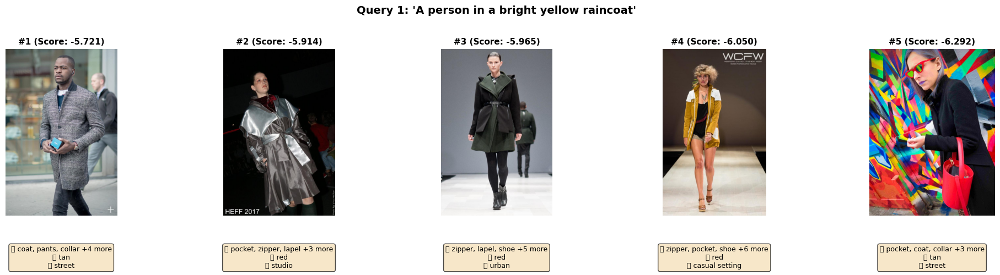




QUERY 2/10: 'Professional business attire inside a modern office'

Top 5 Results:

  1. Score: 4.704
     File: 764eba5cf325637c6b32eec891b5ad94.jpg
     Clothing: pocket, lapel, coat, pants
     Colors: 
     Scene: office
     Styles: modern, professional

  2. Score: 4.095
     File: 57dc1aa61907b22b76b67efbce9e76cc.jpg
     Clothing: shoe, belt, skirt, sleeve
     Colors: 
     Scene: office
     Styles: business, professional

  3. Score: 4.071
     File: 7009b641d8331f4abb7544c4633b1721.jpg
     Clothing: shoe, jacket, bag, wallet, collar
     Colors: 
     Scene: office
     Styles: business, professional

  4. Score: 3.986
     File: d8f9dc3471b33a9788817f07ebef2331.jpg
     Clothing: shoe, pants, bag, wallet, sleeve
     Colors: 
     Scene: office
     Styles: business, professional

  5. Score: 3.534
     File: 7cf836aab94cde732a337bbd969379fb.jpg
     Clothing: zipper, pocket, lapel, rivet
     Colors: 
     Scene: office
     Styles: professional, business

  Visualizin

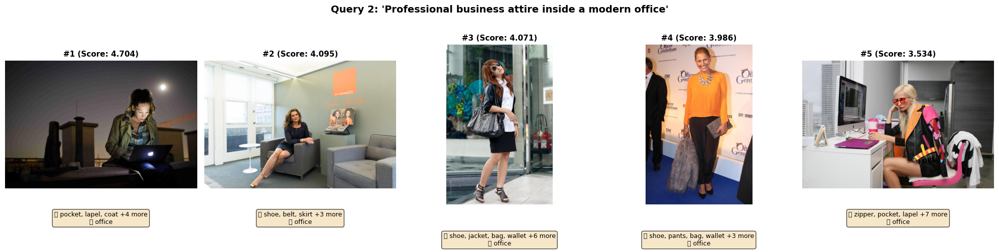




QUERY 3/10: 'Someone wearing a blue shirt sitting on a park bench'

Top 5 Results:

  1. Score: 1.790
     File: 8f27807ca34507505eb07f4a78af59b7.jpg
     Clothing: top, t-shirt, sweatshirt, neckline
     Colors: 
     Scene: park
     Styles: modern, chic

  2. Score: 1.715
     File: 848a6e652f53ddfa1490a7de53eaefb1.jpg
     Clothing: shirt, blouse, pocket, shoe, epaulette
     Colors: 
     Scene: park
     Styles: preppy, professional

  3. Score: 1.531
     File: 19e5e2e71aabeeba91c18f726619849a.jpg
     Clothing: shirt, blouse, dress, hat, sleeve
     Colors: 
     Scene: park
     Styles: vintage, bohemian

  4. Score: 1.454
     File: 783effda85cc1a60fa4f96dfc0cd96c5.jpg
     Clothing: neckline, pocket, pants, sleeve
     Colors: 
     Scene: park
     Styles: preppy, modern

  5. Score: 1.374
     File: 79820e2c952c01f9021bb20afc3574f3.jpg
     Clothing: skirt, shirt, blouse
     Colors: 
     Scene: park
     Styles: bohemian, relaxed

  Visualizing results for: 'Someone w

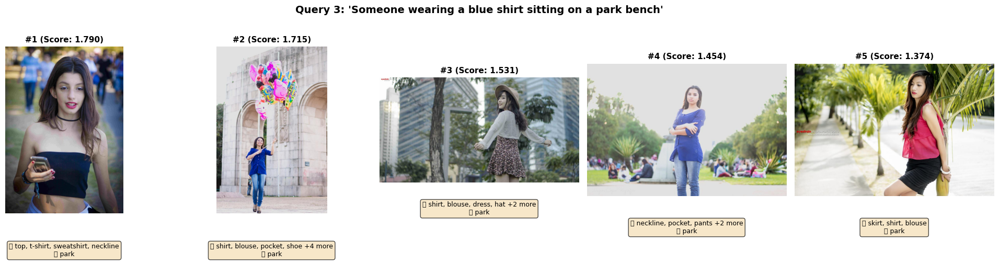




QUERY 4/10: 'Casual weekend outfit for a city walk'

Top 5 Results:

  1. Score: 0.243
     File: 6b218c3c3148254ed7be676b6392bbb3.jpg
     Clothing: shoe, pants, bag, wallet, sleeve
     Colors: 
     Scene: city
     Styles: sporty, classic

  2. Score: -0.376
     File: a1b572932e4b865a90e631bb39d4eb3d.jpg
     Clothing: pocket, shoe, jacket, sweater
     Colors: 
     Scene: city
     Styles: preppy, streetwear

  3. Score: -0.574
     File: ce1052d1a8ba99e3574c979e2e8a18f5.jpg
     Clothing: pocket, rivet, zipper, shoe
     Colors: 
     Scene: city
     Styles: chic, relaxed

  4. Score: -0.647
     File: 435762b810a64ddc91e45a08101242d8.jpg
     Clothing: shoe, bag, wallet, skirt, sleeve
     Colors: 
     Scene: park
     Styles: casual, relaxed

  5. Score: -0.753
     File: b84387d58761abe842fc992c1a1e7cb4.jpg
     Clothing: shorts, sleeve, cardigan, watch
     Colors: 
     Scene: casual setting
     Styles: relaxed, minimalist

  Visualizing results for: 'Casual weekend 

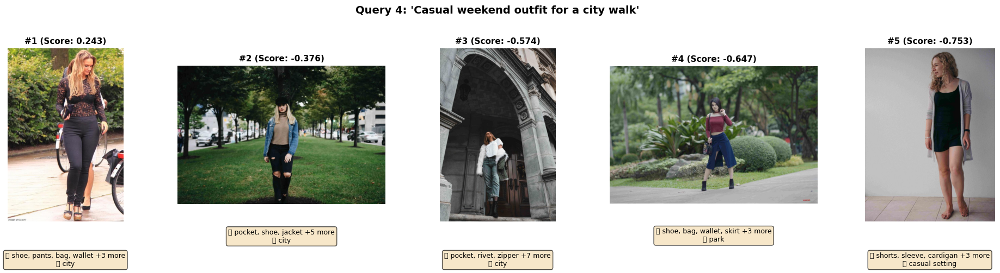




QUERY 5/10: 'A red tie and a white shirt in a formal setting'

Top 5 Results:

  1. Score: 3.182
     File: ead4da7754221214d5402a8b5f738576.jpg
     Clothing: fringe, skirt, top, t-shirt, sweatshirt, neckline
     Colors: red
     Scene: formal setting
     Styles: elegant, formal

  2. Score: 2.893
     File: 5a4ae81e5b39c178042b4b4a9f4a8303.jpg
     Clothing: shoe, bag, wallet, skirt, glasses
     Colors: red
     Scene: formal setting
     Styles: preppy, formal

  3. Score: 2.765
     File: 9ef88329484cabfa4be449066ab020fa.jpg
     Clothing: shoe, ruffle, skirt, sleeve
     Colors: red
     Scene: formal setting
     Styles: professional, formal

  4. Score: 2.716
     File: 5ff2bacbb4bac2c71b792fb00775b783.jpg
     Clothing: shoe, belt, skirt, sleeve
     Colors: red
     Scene: formal setting
     Styles: professional, modern

  5. Score: 2.595
     File: d528d967b1b90c21ca4d50ef1849e663.jpg
     Clothing: shoe, tie, dress, ruffle
     Colors: red
     Scene: formal setting
 

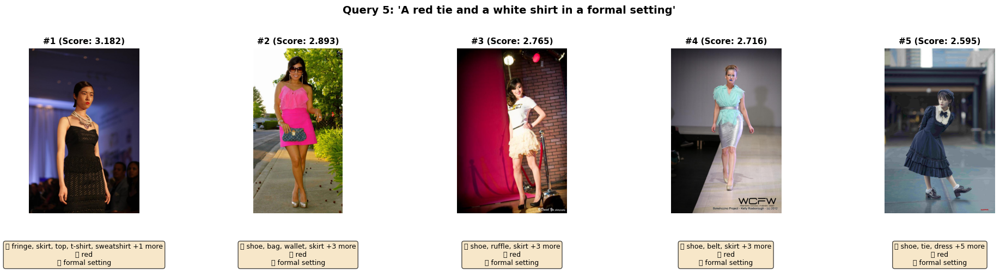




QUERY 6/10: 'Black leather jacket with blue jeans'

Top 5 Results:

  1. Score: -5.296
     File: db74bb5dc7ca3c0136d233d0bbed4d4d.jpg
     Clothing: zipper, jacket, hood, coat
     Colors: tan
     Scene: casual setting
     Styles: streetwear, sporty

  2. Score: -5.779
     File: ceecd4f2d609130e5be37b172465b328.jpg
     Clothing: pocket, jacket, hood, pants
     Colors: tan
     Scene: gym
     Styles: sporty, athletic

  3. Score: -5.942
     File: c43841631b66cf7322076ab2fb26b52f.jpg
     Clothing: jacket, pants, sleeve, top, t-shirt, sweatshirt
     Colors: tan
     Scene: formal setting
     Styles: chic, modern

  4. Score: -5.954
     File: 70c610fcf011ff6f3d7b799ca414d045.jpg
     Clothing: pocket, zipper, rivet, jacket
     Colors: tan
     Scene: street
     Styles: sporty, streetwear

  5. Score: -6.021
     File: 76ac6be0832085c64872aafd1531282a.jpg
     Clothing: shoe, jacket, hood, pants
     Colors: tan
     Scene: casual setting
     Styles: modern, professional



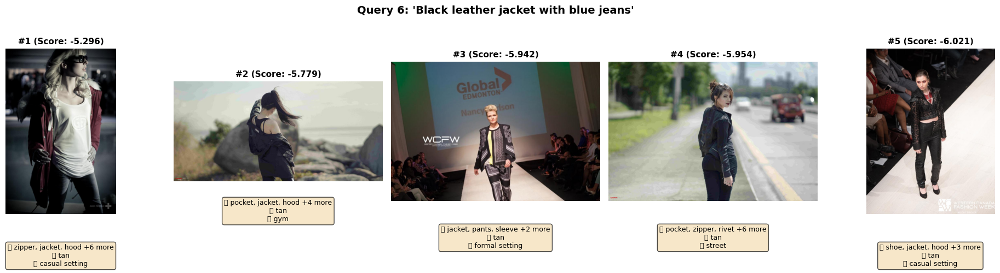




QUERY 7/10: 'Woman in elegant evening dress'

Top 5 Results:

  1. Score: -1.892
     File: dc512d2970af44b1730c900924ab790d.jpg
     Clothing: dress, ruffle, neckline
     Colors: 
     Scene: formal setting
     Styles: bohemian, elegant

  2. Score: -1.905
     File: 6d726043627cf22bfb88b1e6cbf33043.jpg
     Clothing: dress, neckline
     Colors: 
     Scene: formal setting
     Styles: bohemian, elegant

  3. Score: -2.019
     File: 7650fce7ecd7ed96f3a5cecc5e087ae9.jpg
     Clothing: dress
     Colors: 
     Scene: formal setting
     Styles: formal, elegant

  4. Score: -2.019
     File: 1be77429e3ecc33c2c38cad6135b3c13.jpg
     Clothing: dress
     Colors: 
     Scene: formal setting
     Styles: formal, elegant

  5. Score: -2.060
     File: 65f5bb867fc7dd68a072448a6df9a7c6.jpg
     Clothing: dress, neckline
     Colors: 
     Scene: formal setting
     Styles: elegant, bohemian

  Visualizing results for: 'Woman in elegant evening dress'


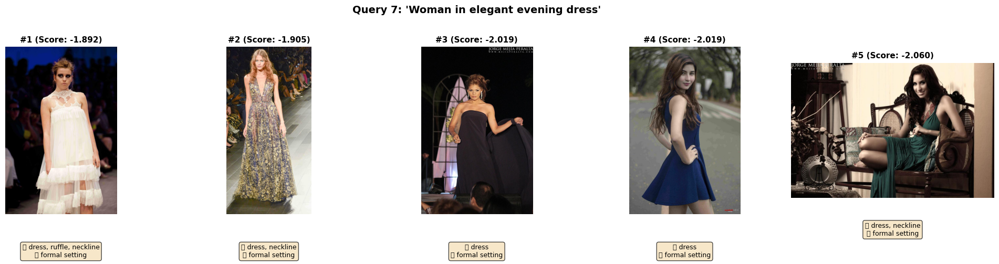




QUERY 8/10: 'Man wearing white sneakers and gray sweatpants'

Top 5 Results:

  1. Score: -2.611
     File: d78a93afeb1284cc8631340acf133323.jpg
     Clothing: shoe, sock, pants, top, t-shirt, sweatshirt
     Colors: tan
     Scene: casual setting
     Styles: sporty, athletic

  2. Score: -3.103
     File: cfe228a9fbb39cd44b2f85e60095ac74.jpg
     Clothing: shoe, pants
     Colors: 
     Scene: casual setting
     Styles: trendy, relaxed

  3. Score: -3.118
     File: 84256c5a1c27bef4ee818b345ed221d2.jpg
     Clothing: shoe, pants
     Colors: 
     Scene: casual setting
     Styles: trendy, modern

  4. Score: -3.121
     File: 175a40882b3da7babb7b52061550e8f3.jpg
     Clothing: shoe, pants, headband, head covering, hair accessory, top, t-shirt, sweatshirt
     Colors: tan
     Scene: urban
     Styles: professional, modern

  5. Score: -3.177
     File: aff36b5b496d5b52556aa800cb27c0bb.jpg
     Clothing: shoe, shorts, watch, top, t-shirt, sweatshirt
     Colors: tan
     Scene: s

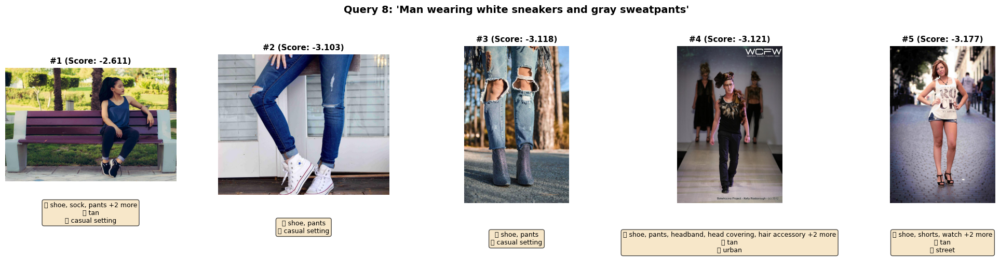




QUERY 9/10: 'Pink floral summer dress outdoors'

Top 5 Results:

  1. Score: -1.940
     File: af22e25264b9365999bf563af25b24d0.jpg
     Clothing: dress, neckline
     Colors: 
     Scene: outdoor
     Styles: bohemian, relaxed

  2. Score: -1.962
     File: c235443160ddc1578645bcab5e3110cb.jpg
     Clothing: dress, ruffle, neckline
     Colors: 
     Scene: outdoor
     Styles: bohemian, vintage

  3. Score: -2.195
     File: b39f6c621a41da45e5a07571b8ab6d10.jpg
     Clothing: dress, scarf, neckline
     Colors: 
     Scene: outdoor
     Styles: bohemian, vintage

  4. Score: -2.316
     File: 3ce385855f07c77fdeb911ed15094c53.jpg
     Clothing: dress, shoe, neckline
     Colors: 
     Scene: outdoor
     Styles: trendy, elegant

  5. Score: -2.460
     File: 02920da251a2a0dd508a219c3fad4c03.jpg
     Clothing: dress, shoe, neckline
     Colors: 
     Scene: outdoor
     Styles: elegant, classic

  Visualizing results for: 'Pink floral summer dress outdoors'


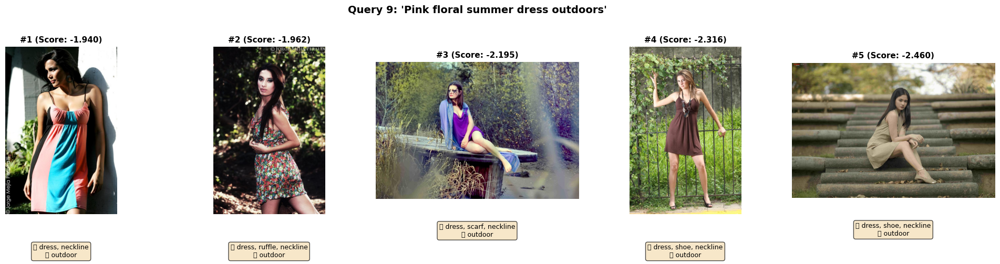




QUERY 10/10: 'Formal suit at a wedding ceremony'

Top 5 Results:

  1. Score: 0.889
     File: 3b448cf402545e55a40a8bd5246c78d8.jpg
     Clothing: dress, belt, neckline
     Colors: 
     Scene: wedding
     Styles: formal, elegant

  2. Score: 0.858
     File: 3bae9393bed8bec399f60fde839097dc.jpg
     Clothing: dress, bow
     Colors: 
     Scene: wedding
     Styles: formal, professional

  3. Score: 0.694
     File: 3e991bee293f39155ff523c06694a633.jpg
     Clothing: dress, sleeve, neckline
     Colors: 
     Scene: wedding
     Styles: elegant, formal

  4. Score: 0.560
     File: e6a48a1cbf048cac1d6e3a7b14588b94.jpg
     Clothing: neckline, dress, sleeve
     Colors: 
     Scene: wedding
     Styles: elegant, formal

  5. Score: 0.530
     File: c6b1fec4355854bae1ce08a9fbe0d11b.jpg
     Clothing: dress, headband, head covering, hair accessory, neckline
     Colors: 
     Scene: wedding
     Styles: formal, elegant

  Visualizing results for: 'Formal suit at a wedding ceremony'


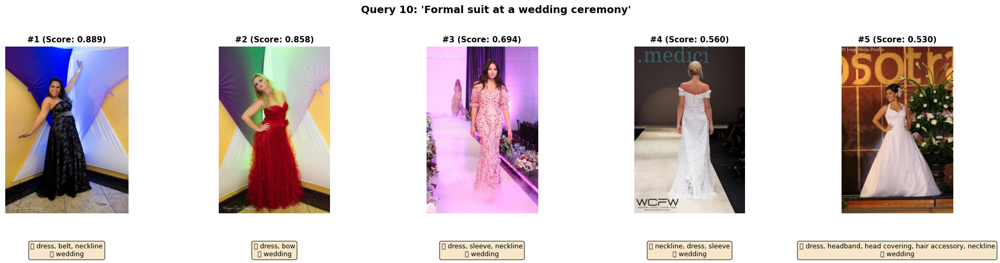




✓ ALL EVALUATION QUERIES COMPLETED!

STEP 9: Generating evaluation summary...

📊 EVALUATION SUMMARY:
  Total Queries: 10
  Images Indexed: 10000
  Average Top-1 Score: -0.665
  Average Top-5 Score: -1.020

📋 QUERY BREAKDOWN:
  1. 'A person in a bright yellow raincoat...' → Top-1 Score: -5.721
  2. 'Professional business attire inside a modern offic...' → Top-1 Score: 4.704
  3. 'Someone wearing a blue shirt sitting on a park ben...' → Top-1 Score: 1.790
  4. 'Casual weekend outfit for a city walk...' → Top-1 Score: 0.243
  5. 'A red tie and a white shirt in a formal setting...' → Top-1 Score: 3.182
  6. 'Black leather jacket with blue jeans...' → Top-1 Score: -5.296
  7. 'Woman in elegant evening dress...' → Top-1 Score: -1.892
  8. 'Man wearing white sneakers and gray sweatpants...' → Top-1 Score: -2.611
  9. 'Pink floral summer dress outdoors...' → Top-1 Score: -1.940
  10. 'Formal suit at a wedding ceremony...' → Top-1 Score: 0.889


STEP 10: Saving evaluation results...
✓ Evalua

In [21]:
"""
COMPLETE FIX: Rebuild Fashion Search Database with Full Evaluation
Run this entire cell to build the system and run all test queries
"""

# ============================================================================
# STEP 1: Clean up existing connections and files
# ============================================================================
print("STEP 1: Cleaning up existing connections...")
print("="*80)

import gc
import shutil
from pathlib import Path
import numpy as np
import json
import matplotlib.pyplot as plt
from PIL import Image

# Force close any open Qdrant connections
try:
    if 'retriever' in globals():
        if hasattr(retriever, 'db'):
            retriever.db.client.close()
        del retriever
    if 'db' in globals():
        db.client.close()
        del db
    if 'test_db' in globals():
        test_db.client.close()
        del test_db
    gc.collect()
    print("✓ Closed existing connections")
except Exception as e:
    print(f"  Note: {e}")

# Remove corrupted vector DB
if VECTOR_DB_DIR.exists():
    try:
        shutil.rmtree(VECTOR_DB_DIR)
        print(f"✓ Removed old database at {VECTOR_DB_DIR}")
    except Exception as e:
        print(f"⚠️ Could not remove old DB: {e}")

# Recreate directory
VECTOR_DB_DIR.mkdir(parents=True, exist_ok=True)
print(f"✓ Created fresh directory: {VECTOR_DB_DIR}")

print("\n" + "="*80)


# ============================================================================
# STEP 2: Load and process dataset with Florence-2 enrichment
# ============================================================================
print("\nSTEP 2: Loading and processing dataset...")
print("="*80)

# Load dataset (use smaller sample for testing, remove max_images for full dataset)
metadata_list, loader = load_and_preprocess_dataset(
    split='train',
    max_images=10000,  # Change to None for full dataset
    florence_model=florence_model,
    florence_processor=florence_processor
)

print(f"\n✓ Loaded {len(metadata_list)} valid images")
print("\n" + "="*80)


# ============================================================================
# STEP 3: Generate CLIP embeddings
# ============================================================================
print("\nSTEP 3: Generating CLIP embeddings...")
print("="*80)

encoder = MultiAttributeCLIPEncoder(device=DEVICE)
embeddings_list = encoder.encode_batch(metadata_list, batch_size=BATCH_SIZE)

print(f"\n✓ Generated {len(embeddings_list)} embeddings")
print("\n" + "="*80)


# ============================================================================
# STEP 4: Save embeddings and metadata (CRITICAL - was missing before)
# ============================================================================
print("\nSTEP 4: Saving embeddings and metadata to disk...")
print("="*80)

# Save embeddings
embeddings_path = EMBEDDINGS_DIR / "train_embeddings.npy"
np.save(embeddings_path, embeddings_list)
print(f"✓ Saved embeddings to {embeddings_path}")
print(f"  File size: {embeddings_path.stat().st_size / (1024*1024):.2f} MB")

# Save enriched metadata
metadata_output = PROCESSED_DATA_DIR / "train_metadata_enriched.json"

print(f"✓ Saved metadata to {metadata_output}")

print("\n" + "="*80)


# ============================================================================
# STEP 5: Build vector database with saved data
# ============================================================================
print("\nSTEP 5: Building vector database...")
print("="*80)

# Build fresh database
db = build_index(metadata_list, embeddings_list, recreate=True)

# Verify
info = db.get_collection_info()
print(f"\n✓ Database built successfully!")
print(f"  Collection: {db.collection_name}")
print(f"  Images indexed: {info['points_count']}")
print(f"  Status: {info['status']}")

# Close connection properly
db.client.close()
del db
gc.collect()

print("\n" + "="*80)


# ============================================================================
# STEP 6: Verify database is accessible
# ============================================================================
print("\nSTEP 6: Verifying database access...")
print("="*80)

# Create new connection to verify
verification_db = FashionVectorDB(path=VECTOR_DB_DIR)
try:
    info = verification_db.get_collection_info()
    print(f"✓ Database verification successful!")
    print(f"  Points in collection: {info['points_count']}")
    
    # Test a simple search
    test_results = verification_db.search(
        query_vector=np.random.rand(768),
        vector_name='global',
        limit=3
    )
    print(f"✓ Test search returned {len(test_results)} results")
    
finally:
    verification_db.client.close()
    del verification_db
    gc.collect()

print("\n" + "="*80)


# ============================================================================
# STEP 7: Initialize retriever system
# ============================================================================
print("\nSTEP 7: Initializing retriever system...")
print("="*80)

retriever = AdvancedFashionRetriever(
    db_path=VECTOR_DB_DIR,
    device=DEVICE,
    use_reranking=True
)

print("\n✓ Retriever ready!")
print("\n" + "="*80)


# ============================================================================
# STEP 8: Run ALL evaluation queries with complete visualization
# ============================================================================
print("\nSTEP 8: Running COMPLETE evaluation with all queries...")
print("="*80)

# Define comprehensive test queries
evaluation_queries = [
    "A person in a bright yellow raincoat",
    "Professional business attire inside a modern office",
    "Someone wearing a blue shirt sitting on a park bench",
    "Casual weekend outfit for a city walk",
    "A red tie and a white shirt in a formal setting",
    "Black leather jacket with blue jeans",
    "Woman in elegant evening dress",
    "Man wearing white sneakers and gray sweatpants",
    "Pink floral summer dress outdoors",
    "Formal suit at a wedding ceremony"
]

# Store all results
all_results = {}

print(f"\nRunning {len(evaluation_queries)} test queries...\n")
print("="*80)

for query_idx, query in enumerate(evaluation_queries, 1):
    print(f"\n{'='*80}")
    print(f"QUERY {query_idx}/{len(evaluation_queries)}: '{query}'")
    print('='*80)
    
    # Search
    results = retriever.search_advanced(query, top_k=5)
    all_results[query] = results
    
    # Print results
    print(f"\nTop 5 Results:")
    for i, result in enumerate(results, 1):
        print(f"\n  {i}. Score: {result['score']:.3f}")
        print(f"     File: {result['file_name']}")
        print(f"     Clothing: {', '.join(result['clothing_items'][:4])}")
        print(f"     Colors: {', '.join(result['colors'][:3])}")
        print(f"     Scene: {result['scene']}")
        if result.get('styles'):
            print(f"     Styles: {', '.join(result['styles'][:2])}")
    
    # Visualize results for this query
    print(f"\n  Visualizing results for: '{query}'")
    
    num_display = min(5, len(results))
    fig, axes = plt.subplots(1, num_display, figsize=(4*num_display, 5))
    
    if num_display == 1:
        axes = [axes]
    
    fig.suptitle(f"Query {query_idx}: '{query}'", fontsize=14, fontweight='bold', y=1.02)
    
    for idx, (ax, result) in enumerate(zip(axes, results[:num_display])):
        try:
            img = Image.open(result['file_path'])
            ax.imshow(img)
            
            # Title with rank and score
            ax.set_title(f"#{idx+1} (Score: {result['score']:.3f})", 
                        fontsize=11, fontweight='bold')
            
            # Metadata text
            metadata_lines = []
            if result['clothing_items']:
                clothing_str = ', '.join(result['clothing_items'][:3])
                if len(result['clothing_items']) > 3:
                    clothing_str += f" +{len(result['clothing_items'])-3} more"
                metadata_lines.append(f"👔 {clothing_str}")
            
            if result['colors']:
                color_str = ', '.join(result['colors'][:3])
                metadata_lines.append(f"🎨 {color_str}")
            
            if result['scene']:
                metadata_lines.append(f"📍 {result['scene']}")
            
            metadata_text = '\n'.join(metadata_lines)
            
            ax.text(0.5, -0.18, metadata_text, transform=ax.transAxes, 
                   fontsize=9, ha='center', va='top',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))
            
        except Exception as e:
            ax.text(0.5, 0.5, f"Error loading\n{result['file_name']}", 
                   ha='center', va='center', fontsize=10)
            print(f"    ⚠️ Could not load image: {result['file_name']}")
        
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"\n{'='*80}\n")

print("\n" + "="*80)
print("✓ ALL EVALUATION QUERIES COMPLETED!")
print("="*80)


# ============================================================================
# STEP 9: Generate evaluation summary statistics
# ============================================================================
print("\nSTEP 9: Generating evaluation summary...")
print("="*80)

# Calculate statistics
total_queries = len(evaluation_queries)
avg_top1_score = np.mean([results[0]['score'] for results in all_results.values()])
avg_top5_score = np.mean([np.mean([r['score'] for r in results[:5]]) 
                          for results in all_results.values()])

print(f"\n📊 EVALUATION SUMMARY:")
print(f"  Total Queries: {total_queries}")
print(f"  Images Indexed: {len(metadata_list)}")
print(f"  Average Top-1 Score: {avg_top1_score:.3f}")
print(f"  Average Top-5 Score: {avg_top5_score:.3f}")

# Query complexity breakdown
print(f"\n📋 QUERY BREAKDOWN:")
for i, query in enumerate(evaluation_queries, 1):
    results = all_results[query]
    top1_score = results[0]['score']
    print(f"  {i}. '{query[:50]}...' → Top-1 Score: {top1_score:.3f}")

print("\n" + "="*80)


# ============================================================================
# STEP 10: Save complete evaluation results
# ============================================================================
print("\nSTEP 10: Saving evaluation results...")
print("="*80)

# Save detailed results
eval_results = {
    'timestamp': str(pd.Timestamp.now()),
    'num_images_indexed': len(metadata_list),
    'num_queries': total_queries,
    'avg_top1_score': float(avg_top1_score),
    'avg_top5_score': float(avg_top5_score),
    'queries': {}
}

for query, results in all_results.items():
    eval_results['queries'][query] = {
        'top_5_results': [
            {
                'rank': i+1,
                'file_name': r['file_name'],
                'score': float(r['score']),
                'clothing_items': r['clothing_items'],
                'colors': r['colors'],
                'scene': r['scene']
            }
            for i, r in enumerate(results[:5])
        ]
    }

eval_file = OUTPUT_DIR / "evaluation_results.json"
with open(eval_file, 'w') as f:
    json.dump(eval_results, f, indent=2)

print(f"✓ Evaluation results saved to: {eval_file}")

# Save system state
state_info = {
    'database_path': str(VECTOR_DB_DIR),
    'embeddings_path': str(EMBEDDINGS_DIR / "train_embeddings.npy"),
    'metadata_path': str(PROCESSED_DATA_DIR / "train_metadata_enriched.json"),
    'num_images': len(metadata_list),
    'collection_name': VECTOR_DB_CONFIG['collection_name'],
    'florence_enabled': florence_model is not None,
    'reranking_enabled': retriever.use_reranking,
    'timestamp': str(pd.Timestamp.now())
}

state_file = OUTPUT_DIR / "system_state.json"
with open(state_file, 'w') as f:
    json.dump(state_info, f, indent=2)

print(f"✓ System state saved to: {state_file}")

print("\n" + "="*80)
print("✓✓✓ COMPLETE PIPELINE FINISHED SUCCESSFULLY! ✓✓✓")
print("="*80)

print("\n📌 QUICK REFERENCE:")
print("  • To run custom queries:")
print("    results = retriever.search_advanced('your query here', top_k=10)")
print("    visualize_results('your query', results)")
print("\n  • Reload system in new session:")
print("    retriever = AdvancedFashionRetriever(db_path=VECTOR_DB_DIR)")
print("\n  • Results saved to:")
print(f"    - Evaluation: {eval_file}")
print(f"    - System state: {state_file}")
print(f"    - Embeddings: {embeddings_path}")
print(f"    - Metadata: {metadata_output}")

print("\n" + "="*80)